### IMPORTAR LIBRERIAS

In [53]:

import plotly
import plotly.express as px
import pandas as pd

import folium
from geopy.geocoders import Nominatim

### CARGAR ARCHIVOS

In [4]:
df = pd.read_csv("despojo_juarez.csv")
df

,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,categoria_delito,...,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud
0,2018,Enero,04/01/2018,00:00:00,2017,Noviembre,28/11/2017,10:00:00,DESPOJO,DELITO DE BAJO IMPACTO,...,INVESTIGACIÃ“N EN CUAUHTEMOC,CUH-5,UI-2SD,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.430780,-99.15585
1,2018,Enero,11/01/2018,00:00:00,2017,Octubre,31/10/2017,16:00:00,DESPOJO,DELITO DE BAJO IMPACTO,...,INVESTIGACIÃ“N EN CUAUHTEMOC,CUH-5,UI-4SD,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.423070,-99.17057
2,2018,Febrero,19/02/2018,00:00:00,2018,Febrero,19/02/2018,11:00:00,DESPOJO,DELITO DE BAJO IMPACTO,...,INVESTIGACIÃ“N EN CUAUHTEMOC,CUH-5,UI-3SD,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.422200,-99.17088
3,2018,Febrero,21/02/2018,00:00:00,2018,Febrero,20/02/2018,13:00:00,DESPOJO,DELITO DE BAJO IMPACTO,...,INVESTIGACIÃ“N EN DELITOS AMBIENTALES Y EN MAT...,A,2 CON DETENIDO 2 C/D,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.429400,-99.15750
4,2018,Marzo,10/03/2018,00:00:00,2018,Febrero,14/02/2018,12:00:00,DESPOJO,DELITO DE BAJO IMPACTO,...,INVESTIGACIÃ“N EN CUAUHTEMOC,CUH-5,UI-1SD,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.426270,-99.16104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,2019,Septiembre,03/09/2019,00:00:00,2019,Agosto,18/08/2019,12:00:00,DELITOS AMBIENTALES,DELITO DE BAJO IMPACTO,...,INVESTIGACIÃ“N EN DELITOS AMBIENTALES Y EN MAT...,A,3 CON DETENIDO 3 C/D,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.427080,-99.16165
121,2021,Febrero,24/02/2021,00:00:00,2021,Febrero,24/02/2021,14:35:00,DELITOS AMBIENTALES,DELITO DE BAJO IMPACTO,...,FISCALÃA DE INVESTIGACIÃ“N TERRITORIAL EN CUA...,CUH-2,UI-3CD,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.430380,-99.15774
122,2021,Diciembre,11/12/2021,00:00:00,2021,Diciembre,11/12/2021,10:00:00,DELITOS AMBIENTALES,DELITO DE BAJO IMPACTO,...,FISCALÃA DE INVESTIGACIÃ“N TERRITORIAL EN CUA...,CUH-2,UI-2CD,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.428180,-99.15622
123,2022,Junio,04/06/2022,00:00:00,2022,Abril,17/04/2022,12:12:00,DELITOS AMBIENTALES,DELITO DE BAJO IMPACTO,...,FISCALÃA DE INVESTIGACIÃ“N EN DELITOS AMBIENT...,A,3 CON DETENIDO 3 C/D,JUÃREZ,Juarez,CUAUHTEMOC,CuauhtÃ©moc,CDMX,19.421980,-99.17406


### IMPRIME TODOS 

In [6]:
fig_todos = px.scatter_mapbox(df,
                        lat='latitud',
                        lon='longitud',
                        hover_name="delito", 
                        #hover_data=["delito"],
                        zoom=13, 
                        height=800,
                        width=800
                       )

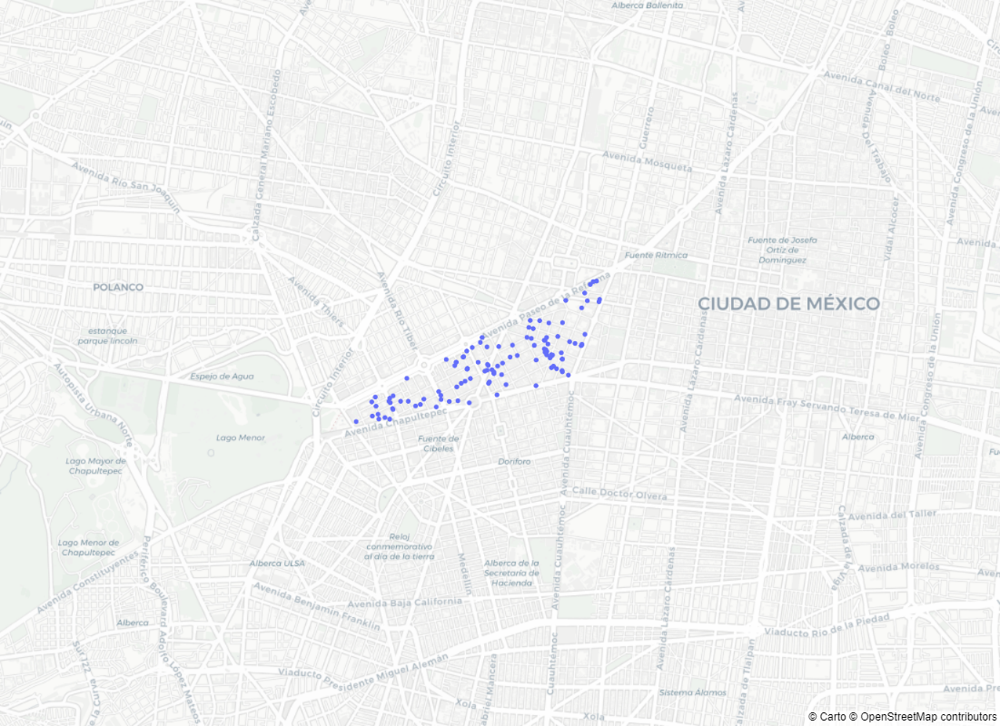

In [7]:
fig_todos.update_layout(mapbox_style="carto-positron")
fig_todos.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_todos.show()

### SEPARA POR COLOR

In [9]:
df['color'] = df['delito'].apply(
    lambda x: 'blue' if x == 'DESPOJO' else
              'red' if x == 'DELITOS AMBIENTALES' else 'black'
)

In [10]:
fig_delito = px.scatter_mapbox(
    df,
    lat='latitud',
    lon='longitud',
    hover_name="delito", 
    hover_data=["delito"],
    zoom=13, 
    height=800,
    width=800,
    color='color'  # Use the new color column
)

### MUESTRA POR DELITO

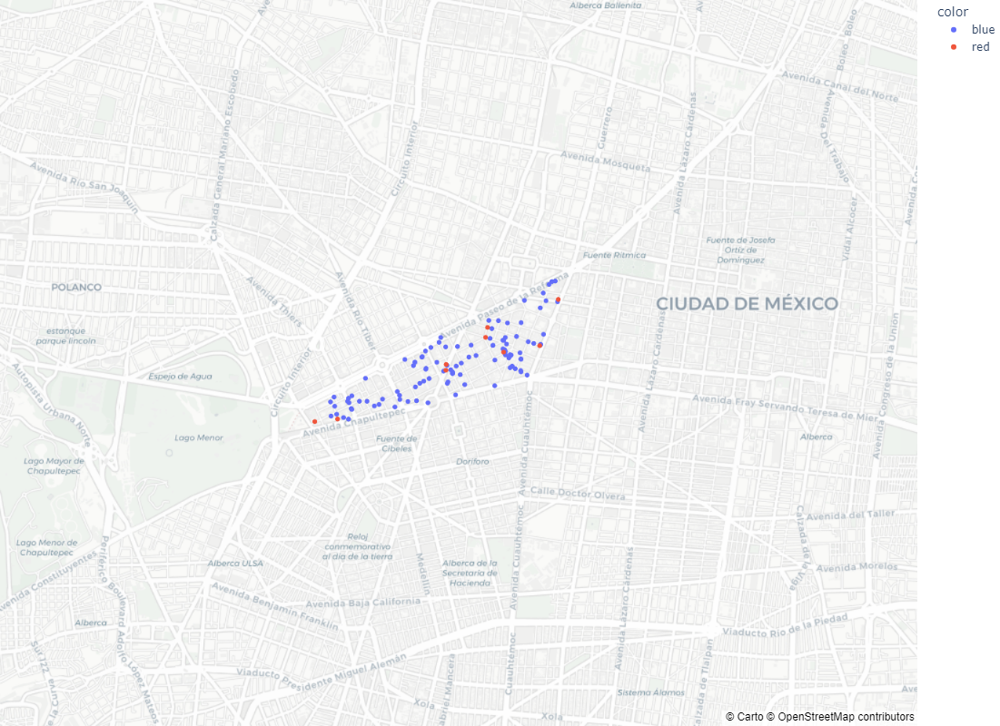

In [12]:
fig_delito.update_layout(mapbox_style="carto-positron")
fig_delito.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_delito.show()

### 2018 2019 2020

In [14]:
df_1 = df[df['anio_inicio'].isin([2018, 2019, 2020])]
df_des_1 = df_1[df_1['delito'].isin(['DESPOJO'])]

In [61]:
df_1 = df[df['anio_inicio'].isin([2018, 2019, 2020])]
fig_18_20 = px.scatter_mapbox(
    df_des_1,
    lat='latitud',
    lon='longitud',
    hover_name="anio_inicio", 
    hover_data=["delito"],
    zoom=13, 
    height=800,
    width=800,
    color='anio_inicio'
)

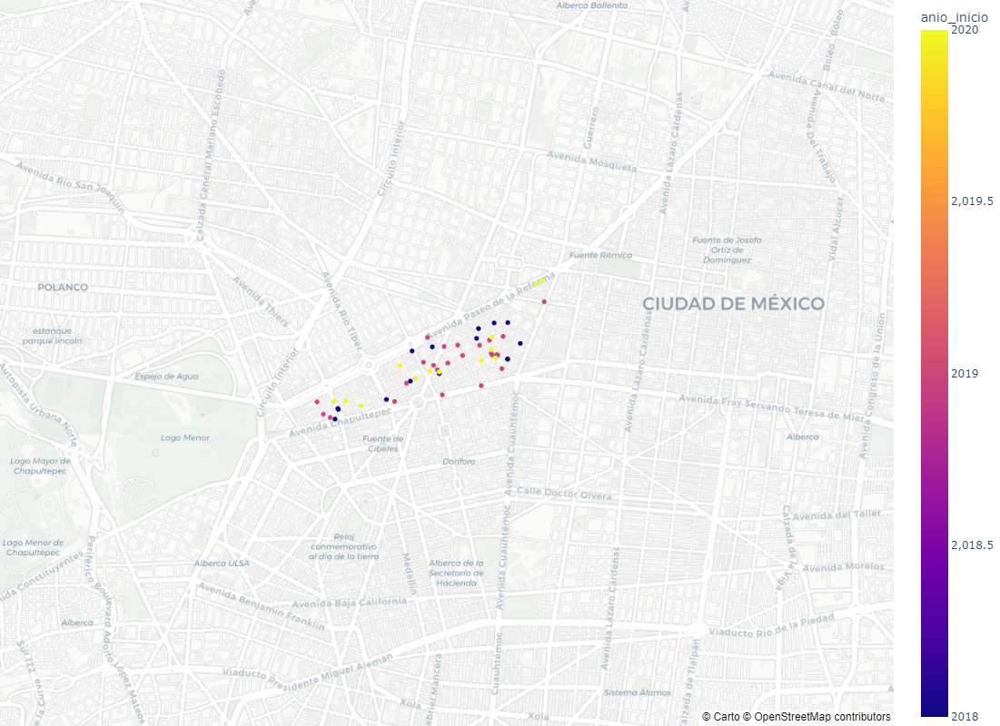

In [63]:
fig_18_20.update_layout(mapbox_style="carto-positron")
fig_18_20.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_18_20.show()

### 2021 2022 2023 2024

In [18]:
df_2 = df[df['anio_inicio'].isin([2021, 2022, 2023, 2024])]
df_des_2 = df_2[df_2['delito'].isin(['DESPOJO'])]

In [65]:
fig_21_24 = px.scatter_mapbox(
    df_des_2,
    lat='latitud',
    lon='longitud',
    hover_name="anio_inicio", 
    hover_data=["delito"],
    zoom=13, 
    height=800,
    width=800 ,
        color='anio_inicio'
)

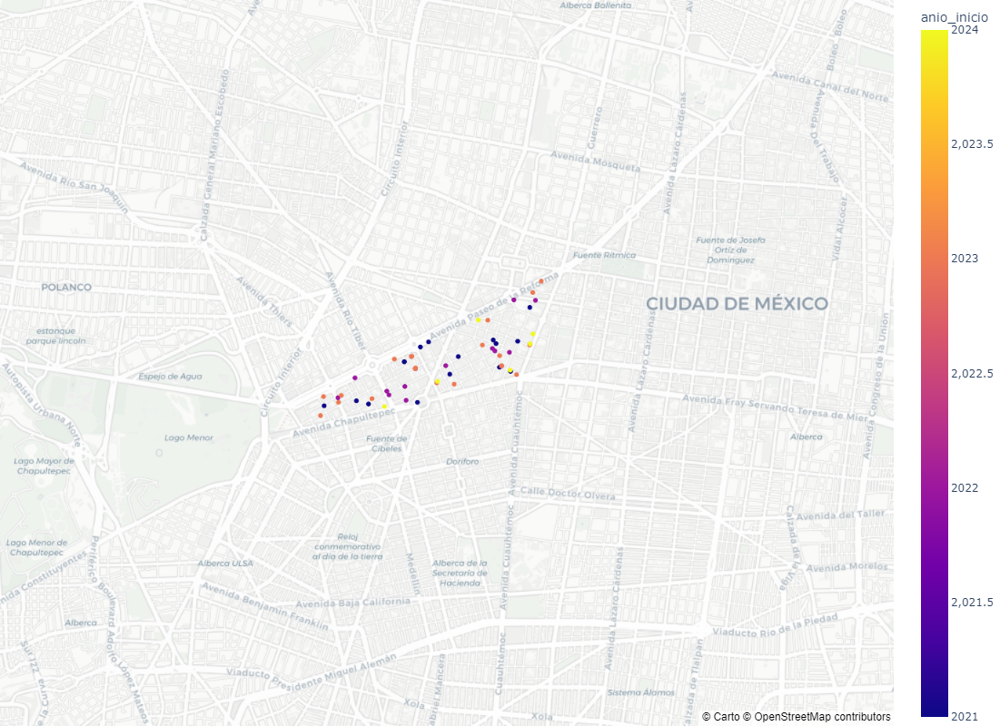

In [67]:
fig_21_24.update_layout(mapbox_style="carto-positron")
fig_21_24.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_21_24.show()

### DELITOS AMBIENTALES

In [39]:
df_ambientales = df[df['delito'].isin(['DELITOS AMBIENTALES'])]

In [69]:
fig_ambientales = px.scatter_mapbox(
    df_ambientales,
    lat='latitud',
    lon='longitud',
    hover_name="anio_inicio", 
    hover_data=["delito"],
    zoom=13, 
    height=800,
    width=800,
    color='anio_inicio'
)

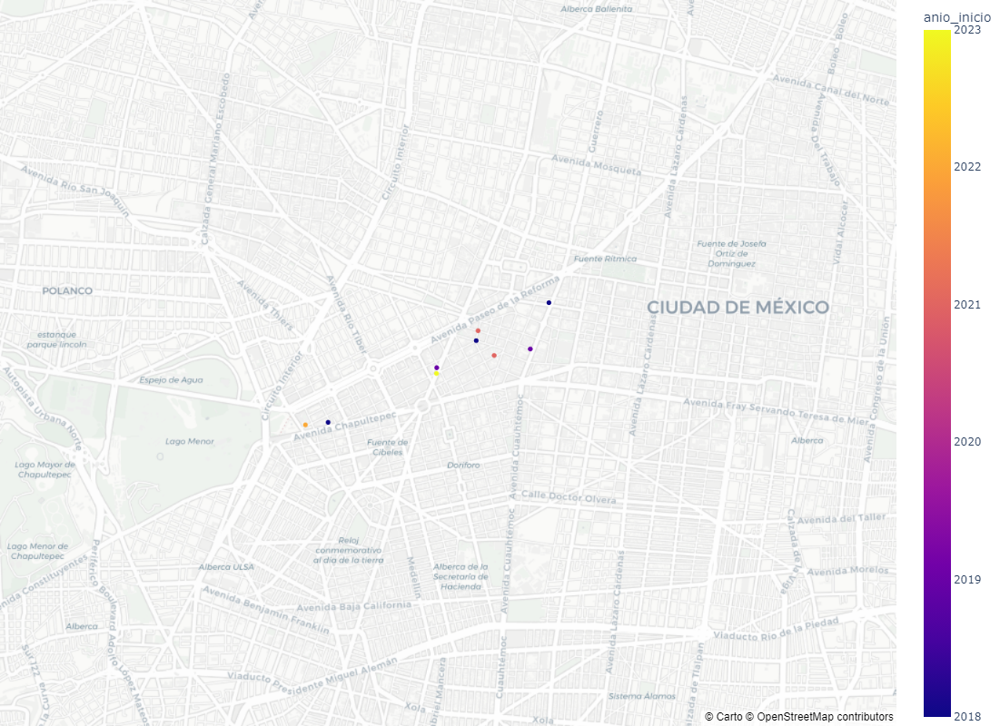

In [71]:
fig_ambientales.update_layout(mapbox_style="carto-positron")
fig_ambientales.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_ambientales.show()